# Basic model

A base model for using a GAN to upscale audio.

### Get data and preprocess

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
from pydub import AudioSegment
import random
from tqdm import tqdm
import wave # https://docs.python.org/3/library/wave.html

In [6]:
DATA_DIR = os.getcwd() + "/../../data/MiniMega.wav"
wav_file = wave.open(DATA_DIR)
AudioSegment.from_file(file=DATA_DIR)

In [9]:
# save a copy that has noise
NOISE_DIR = os.getcwd() + '/../../data/MiniMega_noise.wav'
test_audio = AudioSegment.from_file(file = DATA_DIR)
audio_data = test_audio.split_to_mono()[0]._data

# add noise to audio data to create mod_audio
mod_audio = []
for i in tqdm(test_audio.split_to_mono()[0]._data):
    add_noise = random.randint(-3,3)
    if i + add_noise <0:
        i = 0
    elif i + add_noise >255:
        i = 255
    else:
        i = i + add_noise
    mod_audio.append(i)
mod_audio = bytes(mod_audio)

# write mod_aduio to .wav file
sampleRate = 48000 # hertz
frequency = 440.0 # hertz
obj = wave.open(NOISE_DIR,'w')
obj.setnchannels(1)
obj.setsampwidth(2)
obj.setframerate(48000)
obj.setnframes(323584)
obj.writeframesraw(mod_audio)
obj.close()

100%|██████████| 57388546/57388546 [01:12<00:00, 793534.95it/s]


In [13]:
noise_wav = wave.open(NOISE_DIR)
AudioSegment.from_file(file=NOISE_DIR)

### Build Basic GAN

In [2]:
!pip install nnAudio

In [3]:
from nnAudio import Spectrogram
from scipy.io import wavfile

import torch
import torchaudio
import torch.nn as nn
import torch.nn.functional as F

import matplotlib.pyplot as plt

In [29]:
wav_file = "/Users/patriciadegner/Documents/MIDS/Capstone/data/MiniMega.wav"
noise_file = "/Users/patriciadegner/Documents/MIDS/Capstone/data/MiniMega_noise.wav"

In [78]:
waveform_y, sample_rate_y = torchaudio.load(wav_file)
waveform_x, sample_rate_x = torchaudio.load(noise_file)

# https://github.com/KinWaiCheuk/nnAudio/blob/master/Installation/nnAudio/Spectrogram.py
spec = Spectrogram.MelSpectrogram(
            n_fft=2048, hop_length=512, window="hann", center=True, pad_mode="reflect", fmin=50,
            fmax=6000, sr=48000, device="cpu", n_mels=128)

spectrogram_x = spec(waveform_x)
spectrogram_y = spec(waveform_y)

STFT filter created, time used = 0.0031 seconds
Mel filter created, time used = 0.0033 seconds


In [79]:
print(spectrogram_x.shape, spectrogram_y.shape)
# returns a tensor of spectrograms.  shape = ``(num_samples, freq_bins, time_steps)``

torch.Size([1, 128, 56044]) torch.Size([1, 128, 56044])


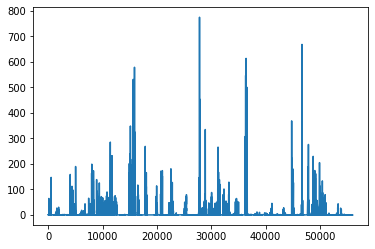

In [80]:
plt.plot(spectrogram_x[0][2])

In [43]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv1d(128, 100, 1, stride=2)
        self.pool1 = nn.AvgPool1d(2)
        self.conv2 = nn.Conv1d(100, 50, 3, stride=2)
        self.pool2 = nn.AvgPool1d(2)
        self.fc1 = nn.Linear(50, 512)
        self.dropout1 = nn.Dropout2d(0.25)
        self.fc2 = nn.Linear(512, 200)
        self.dropout2 = nn.Dropout2d(0.5)
    
    def forward(self, x):
        x = self.conv1(x)
        x = self.pool1(x)
        x = self.conv2(x)
        x = self.pool2(x)
        x = x.transpose(1, 2).transpose(0, 1)
        x = F.tanh(x)
        x = self.fc1(x)
        x = self.dropout1(x)
        x = F.tanh(x)
        x = self.fc2(x)
        x = self.dropout2(x)
        return x

my_nn = Net()
print(my_nn)

Net(
  (conv1): Conv1d(128, 100, kernel_size=(1,), stride=(2,))
  (pool1): AvgPool1d(kernel_size=(2,), stride=(2,), padding=(0,))
  (conv2): Conv1d(100, 50, kernel_size=(3,), stride=(2,))
  (pool2): AvgPool1d(kernel_size=(2,), stride=(2,), padding=(0,))
  (fc1): Linear(in_features=50, out_features=512, bias=True)
  (dropout1): Dropout2d(p=0.25, inplace=False)
  (fc2): Linear(in_features=512, out_features=200, bias=True)
  (dropout2): Dropout2d(p=0.5, inplace=False)
)


In [50]:
y_pred = my_nn(spectrogram_y)
print(y_pred.shape, spectrogram_y.shape)

torch.Size([3502, 1, 200]) torch.Size([1, 128, 56044])


In [46]:
learning_rate = 1e-6
loss_fn = torch.nn.MSELoss()
for t in range(500):
    # Forward pass: compute predicted y by passing x to the model. Module objects
    # override the __call__ operator so you can call them like functions. When
    # doing so you pass a Tensor of input data to the Module and it produces
    # a Tensor of output data.
    y_pred = my_nn(spectrogram_x)

    # Compute and print loss. We pass Tensors containing the predicted and true
    # values of y, and the loss function returns a Tensor containing the
    # loss.
    loss = loss_fn(y_pred, y)
    if t % 100 == 99:
        print(t, loss.item())

    # Zero the gradients before running the backward pass.
    my_nn.zero_grad()

    # Backward pass: compute gradient of the loss with respect to all the learnable
    # parameters of the model. Internally, the parameters of each Module are stored
    # in Tensors with requires_grad=True, so this call will compute gradients for
    # all learnable parameters in the model.
    loss.backward()

    # Update the weights using gradient descent. Each parameter is a Tensor, so
    # we can access its gradients like we did before.
    with torch.no_grad():
        for param in my_nn.parameters():
            param -= learning_rate * param.grad

/Users/patriciadegner/opt/anaconda3/lib/python3.7/site-packages/torch/nn/modules/loss.py:445: UserWarning: Using a target size (torch.Size([128, 28694273])) that is different to the input size (torch.Size([3502, 1, 200])). This will likely lead to incorrect results due to broadcasting. Please ensure they have the same size.
  return F.mse_loss(input, target, reduction=self.reduction)


RuntimeError: The size of tensor a (200) must match the size of tensor b (28694273) at non-singleton dimension 2

In [7]:
# #### Things I may want later...

# spec = Spectrogram.STFT(
#             n_fft=2048, freq_bins=None, hop_length=512, window="hann",
#             freq_scale="no", center=True, pad_mode="reflect", fmin=50,
#             fmax=6000, sr=48000, trainable=False, output_format="Magnitude", device="cpu"
#         )
# test = spec(waveform)

STFT kernels created, time used = 0.0937 seconds


## Attempting method from first_model

In [11]:
m1 = nn.Conv1d(251, 100, 3,stride=2)
output = m1(spectogram)
p1 = nn.AvgPool1d(2)
output = p1(output)
m2 = nn.Conv1d(100, 100, 3,stride=2)
output = m2(output)
p2 = nn.AvgPool1d(2)
output = p2(output)
output = output.transpose(1, 2).transpose(0, 1)
n1 = nn.Linear(100, 50)
output = n1(output)

In [15]:
class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv1d(251, 100, 1, stride=2)
        self.pool1 = nn.AvgPool1d(2)
        self.conv2 = nn.Conv1d(100, 50, 3, stride=2)
        self.pool2 = nn.AvgPool1d(2)
        self.fc1 = nn.Linear(50, 512)
        self.dropout1 = nn.Dropout2d(0.25)
        self.fc2 = nn.Linear(512, 200)
        self.dropout2 = nn.Dropout2d(0.5)
    
    def forward(self, x):
        x = self.conv1(x)
        x = self.pool1(x)
        x = self.conv2(x)
        x = self.pool2(x)
        x = x.transpose(1, 2).transpose(0, 1)
        x = F.tanh(x)
        x = self.fc1(x)
        x = self.dropout1(x)
        x = F.tanh(x)
        x = self.fc2(x)
        x = self.dropout2(x)
        return x

my_nn = Net()
print(my_nn)

Net(
  (conv1): Conv1d(251, 100, kernel_size=(1,), stride=(2,))
  (pool1): AvgPool1d(kernel_size=(2,), stride=(2,), padding=(0,))
  (conv2): Conv1d(100, 50, kernel_size=(3,), stride=(2,))
  (pool2): AvgPool1d(kernel_size=(2,), stride=(2,), padding=(0,))
  (fc1): Linear(in_features=50, out_features=512, bias=True)
  (dropout1): Dropout2d(p=0.25, inplace=False)
  (fc2): Linear(in_features=512, out_features=200, bias=True)
  (dropout2): Dropout2d(p=0.5, inplace=False)
)


In [17]:
result = my_nn(spectogram)
print (result)

tensor([[[ 0.0626, -0.2163,  0.1867,  ...,  0.0142,  0.0252, -0.0357]],

        [[ 0.0000, -0.0000,  0.0000,  ...,  0.0000,  0.0000, -0.0000]],

        [[ 0.0625, -0.2166,  0.1865,  ...,  0.0140,  0.0252, -0.0358]],

        ...,

        [[ 0.0000, -0.0000,  0.0000,  ...,  0.0000,  0.0000, -0.0000]],

        [[ 0.0000, -0.0000,  0.0000,  ...,  0.0000,  0.0000, -0.0000]],

        [[ 0.0000,  0.0000,  0.0000,  ..., -0.0000,  0.0000, -0.0000]]],
       grad_fn=<MulBackward0>)


/Users/patriciadegner/opt/anaconda3/lib/python3.7/site-packages/torch/nn/functional.py:1614: UserWarning: nn.functional.tanh is deprecated. Use torch.tanh instead.
  warnings.warn("nn.functional.tanh is deprecated. Use torch.tanh instead.")


In [26]:
file_y = "/Users/patriciadegner/Documents/MIDS/Capstone/data/MiniMega.wav"
file_x = "/Users/patriciadegner/Documents/MIDS/Capstone/data/MiniMega_noise.wav"
waveform_y, sample_rate = torchaudio.load(file_y)
waveform_x, sample_rate = torchaudio.load(file_x)
y = torchaudio.transforms.MelScale(n_mels=128, sample_rate=48000)(waveform_y)
x = torchaudio.transforms.MelScale(n_mels=128, sample_rate=48000)(waveform_x)

In [27]:
print(waveform_y.shape)
y.shape

torch.Size([1, 28694273])


torch.Size([128, 28694273])

In [28]:
learning_rate = 1e-6
loss_fn = torch.nn.MSELoss()
for t in range(500):
    # Forward pass: compute predicted y by passing x to the model. Module objects
    # override the __call__ operator so you can call them like functions. When
    # doing so you pass a Tensor of input data to the Module and it produces
    # a Tensor of output data.
    y_pred = my_nn(x)

    # Compute and print loss. We pass Tensors containing the predicted and true
    # values of y, and the loss function returns a Tensor containing the
    # loss.
    loss = loss_fn(y_pred, y)
    if t % 100 == 99:
        print(t, loss.item())

    # Zero the gradients before running the backward pass.
    my_nn.zero_grad()

    # Backward pass: compute gradient of the loss with respect to all the learnable
    # parameters of the model. Internally, the parameters of each Module are stored
    # in Tensors with requires_grad=True, so this call will compute gradients for
    # all learnable parameters in the model.
    loss.backward()

    # Update the weights using gradient descent. Each parameter is a Tensor, so
    # we can access its gradients like we did before.
    with torch.no_grad():
        for param in my_nn.parameters():
            param -= learning_rate * param.grad

RuntimeError: Expected 3-dimensional input for 3-dimensional weight [100, 251, 1], but got 2-dimensional input of size [128, 28694273] instead